In [3]:

import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

import ultralytics

https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.




0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 19.1ms
1: 640x640 4 persons, 1 bus, 19.1ms
Speed: 2.9ms preprocess, 19.1ms inference, 47.2ms postprocess per image at shape (1, 3, 640, 640)


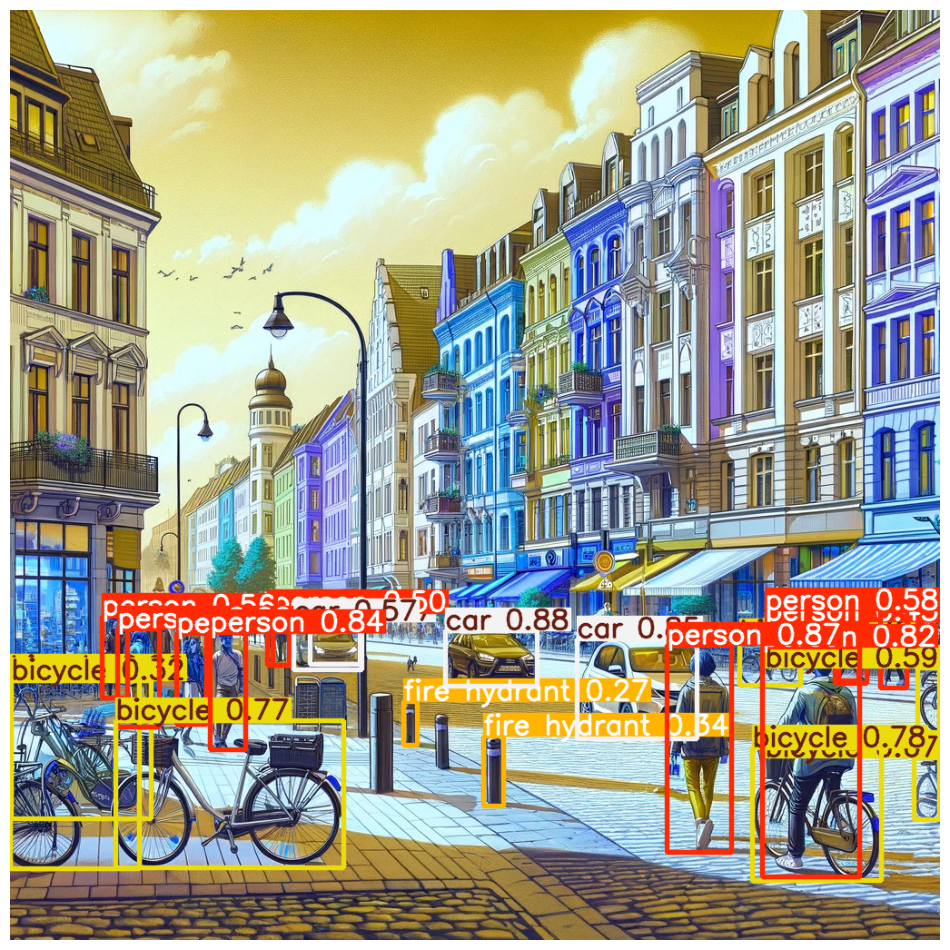

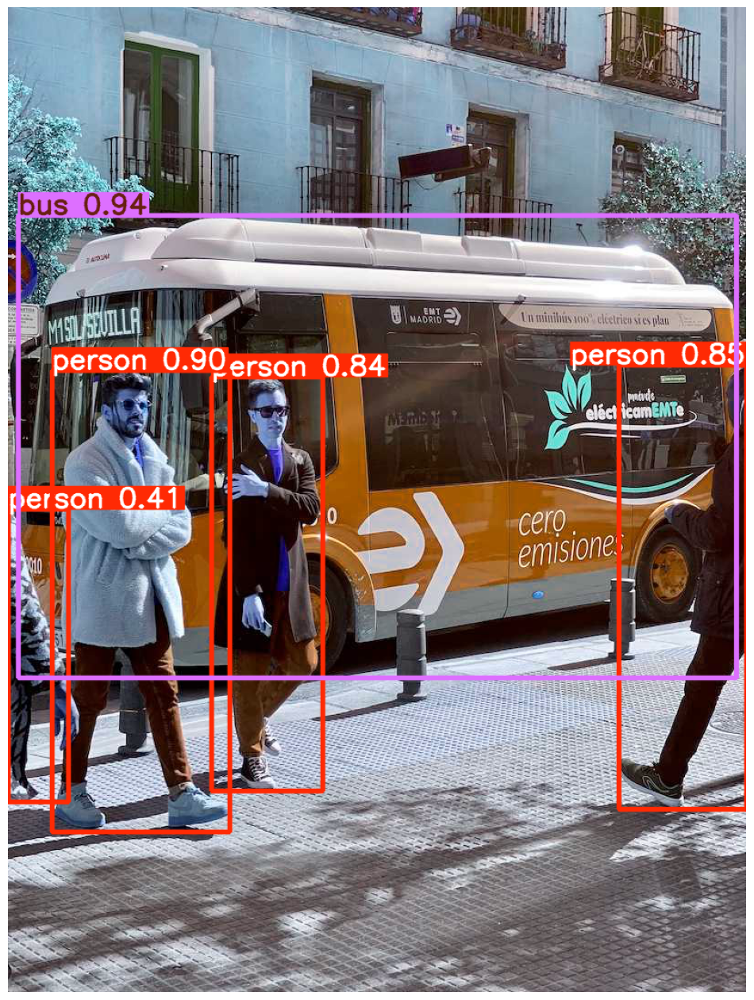

In [4]:
model = YOLO("yolo11n.pt")

image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](Datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](Datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.

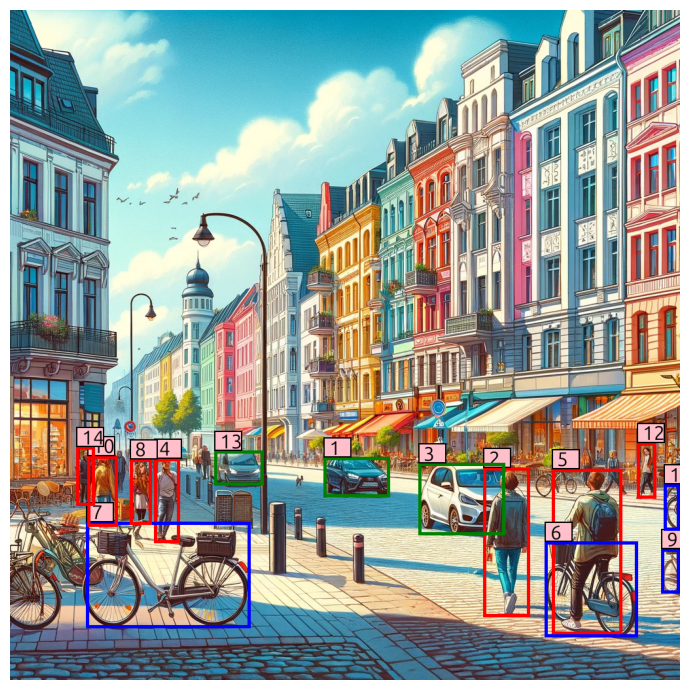

Recuadro 1: Clase=car, Score=0.88, Caja=tensor([479.8960, 683.6411, 580.6784, 744.2575], device='cuda:0')
Recuadro 2: Clase=person, Score=0.87, Caja=tensor([723.8771, 699.6435, 794.2371, 927.2510], device='cuda:0')
Recuadro 3: Clase=car, Score=0.85, Caja=tensor([624.3300, 692.6479, 756.9222, 802.4666], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([220.4718, 685.4081, 259.8445, 814.4362], device='cuda:0')
Recuadro 5: Clase=person, Score=0.82, Caja=tensor([828.3510, 701.1092, 935.8190, 954.4772], device='cuda:0')
Recuadro 6: Clase=bicycle, Score=0.78, Caja=tensor([817.9804, 812.5582, 959.1474, 958.2824], device='cuda:0')
Recuadro 7: Clase=bicycle, Score=0.77, Caja=tensor([116.6449, 782.1414, 367.2630, 944.5010], device='cuda:0')
Recuadro 8: Clase=person, Score=0.72, Caja=tensor([183.0256, 686.3406, 216.2394, 786.7189], device='cuda:0')
Recuadro 9: Clase=bicycle, Score=0.67, Caja=tensor([ 995.5471,  823.9869, 1023.6987,  891.5312], device='cuda:0')
Recuadro 10: Clase

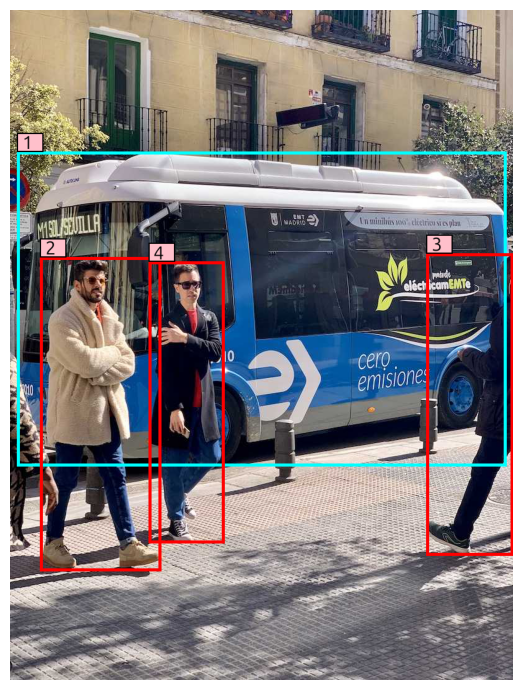

Recuadro 1: Clase=bus, Score=0.94, Caja=tensor([ 11.9248, 228.3091, 799.1647, 735.2815], device='cuda:0')
Recuadro 2: Clase=person, Score=0.90, Caja=tensor([ 48.6603, 398.1494, 243.0634, 904.5159], device='cuda:0')
Recuadro 3: Clase=person, Score=0.85, Caja=tensor([670.5941, 392.3191, 810.0000, 879.5950], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([223.0515, 405.6128, 345.2903, 859.6830], device='cuda:0')


In [5]:
for i,_ in enumerate(results):
    detections = results[i].boxes 
    filtered_detections = []  

    for j, (cls, score, box) in enumerate(zip(detections.cls, detections.conf, detections.xyxy)):
        if score > 0.5:  
            filtered_detections.append((j, cls, score, box)) # Añadir hits

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("usr/share/fonts/truetype/ubuntu/Ubuntu-B.ttf", size=30)

    legend = []

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)] 

    for idx, (i, cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))

        legend.append(f"Recuadro {idx}: Clase={class_name}, Score={score:.2f}, Caja={box}")
        
        # Dibujar las cajas con su número
        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+2 + 40, box[1]],fill="black")
        draw.rectangle([box[0]+2, box[1]-28, box[0] + 40, box[1]-2],fill="pink")
        draw.text((box[0]+8, box[1]-32), str(idx), fill="black",font=font)

    plt.figure(figsize=(13,7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    [print(i) for i in legend]

## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 8 bicycles, 3 cars, 1 backpack, 6.7ms
1: 640x640 4 persons, 1 bus, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


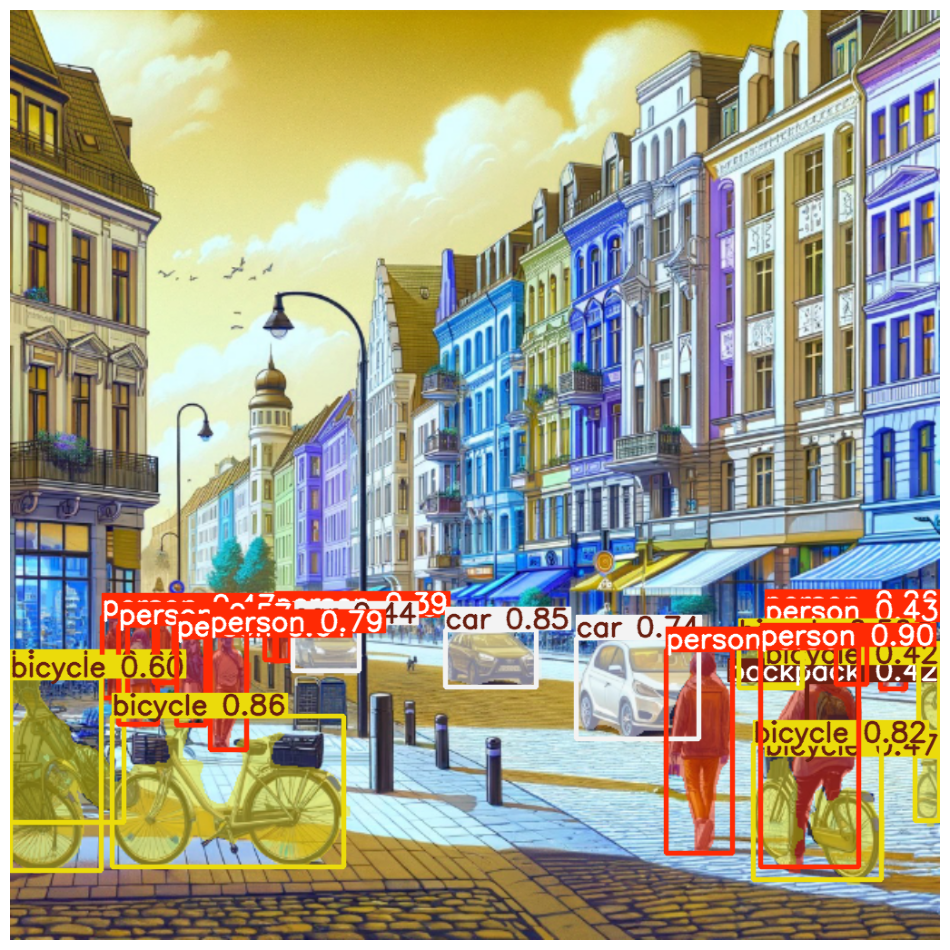

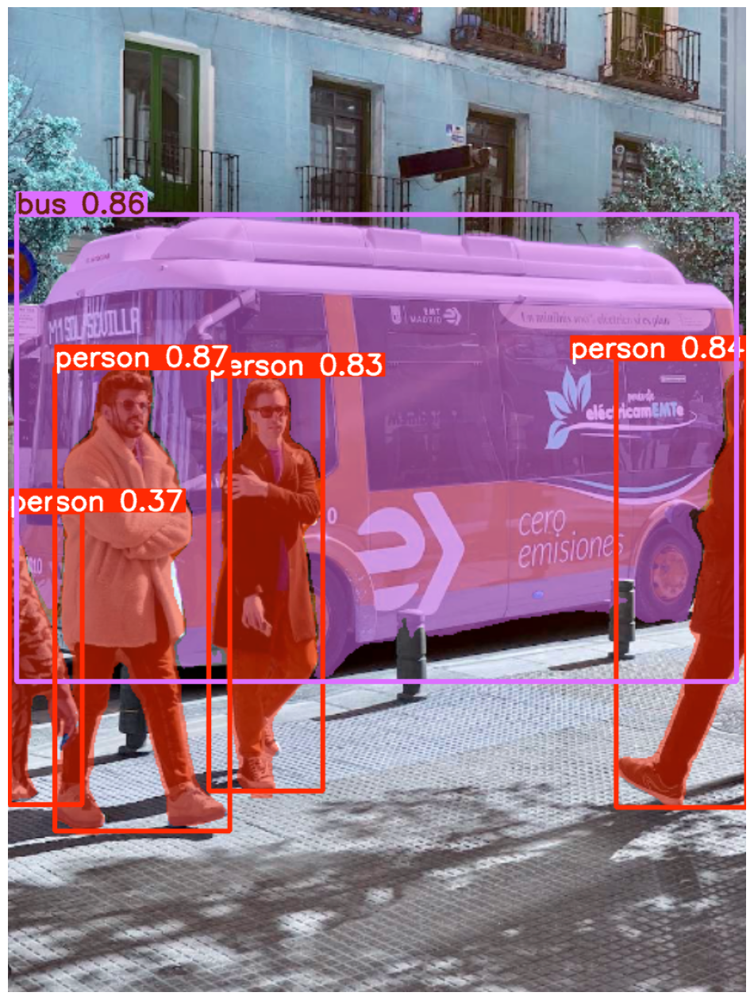

In [6]:
model = YOLO('yolo11n-seg.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.


0: 640x640 2 persons, 6.8ms
1: 640x640 4 persons, 6.8ms
Speed: 1.5ms preprocess, 6.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


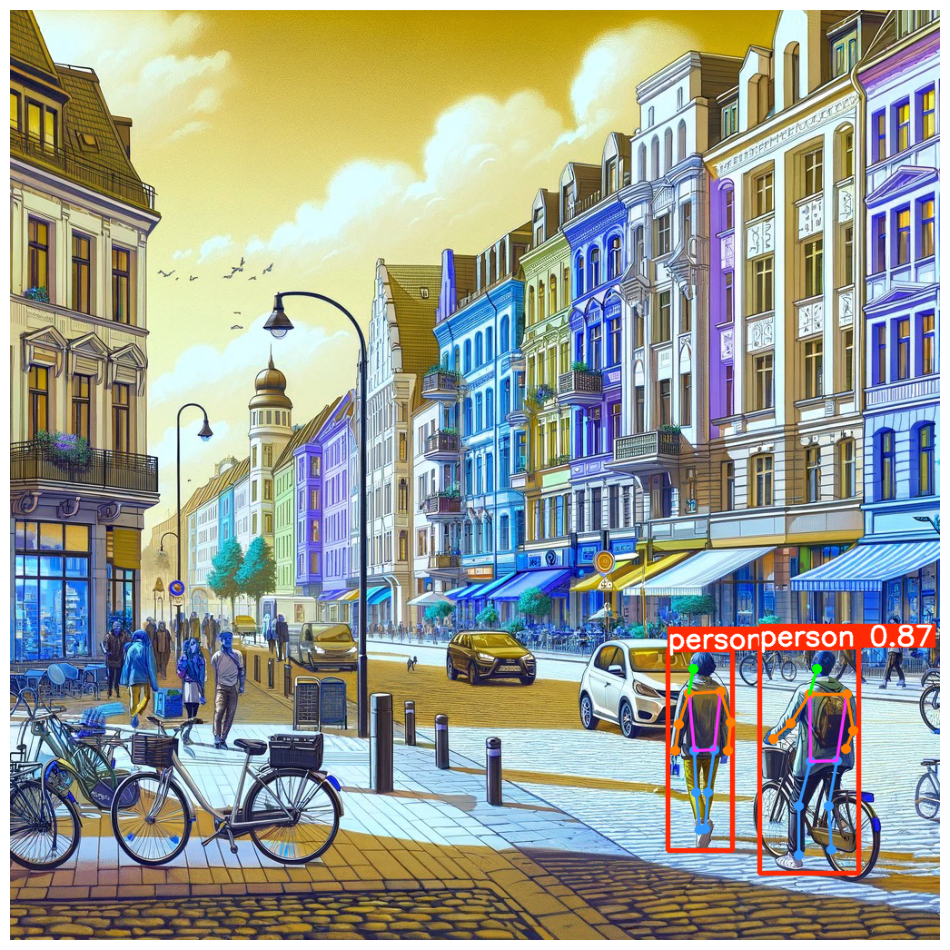

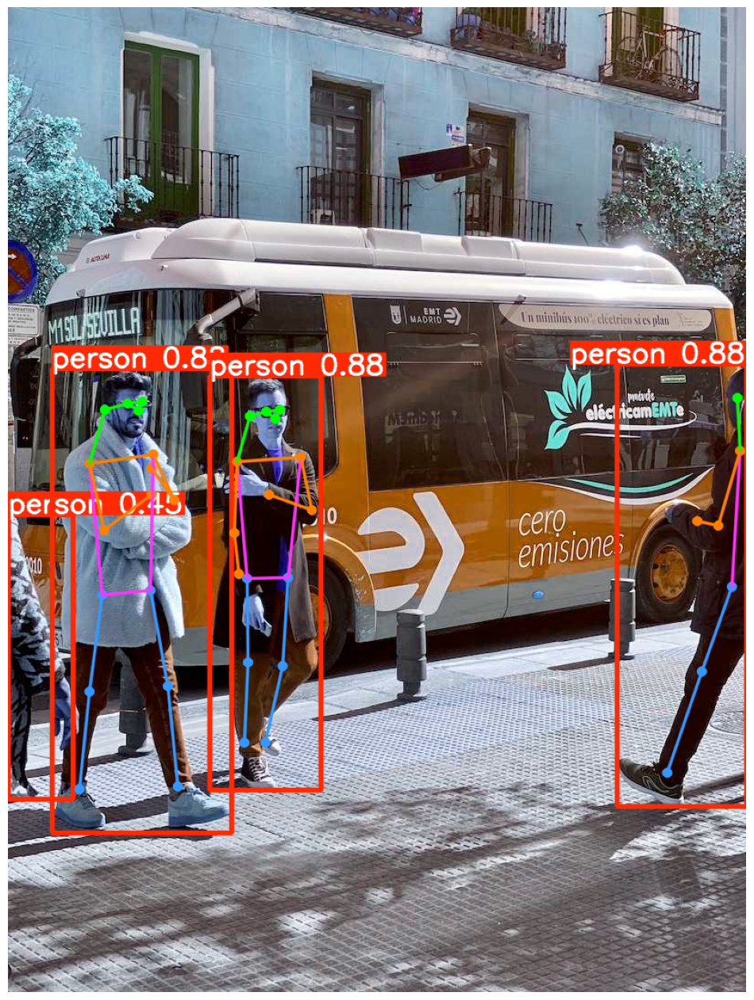

In [7]:
model = YOLO('yolo11n-pose.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```

In [8]:
!yolo predict model="yolo11n.pt" source='mika.jpg' project="predicciones" conf=0.25 task=detect mode=predict save=True

Ultralytics 8.3.75 🚀 Python-3.12.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

image 1/1 /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/mika.jpg: 640x480 1 cat, 31.0ms
Speed: 3.0ms preprocess, 31.0ms inference, 87.7ms postprocess per image at shape (1, 3, 640, 480)
Results saved to predicciones/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict



0: 640x480 1 cat, 32.0ms
Speed: 1.6ms preprocess, 32.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


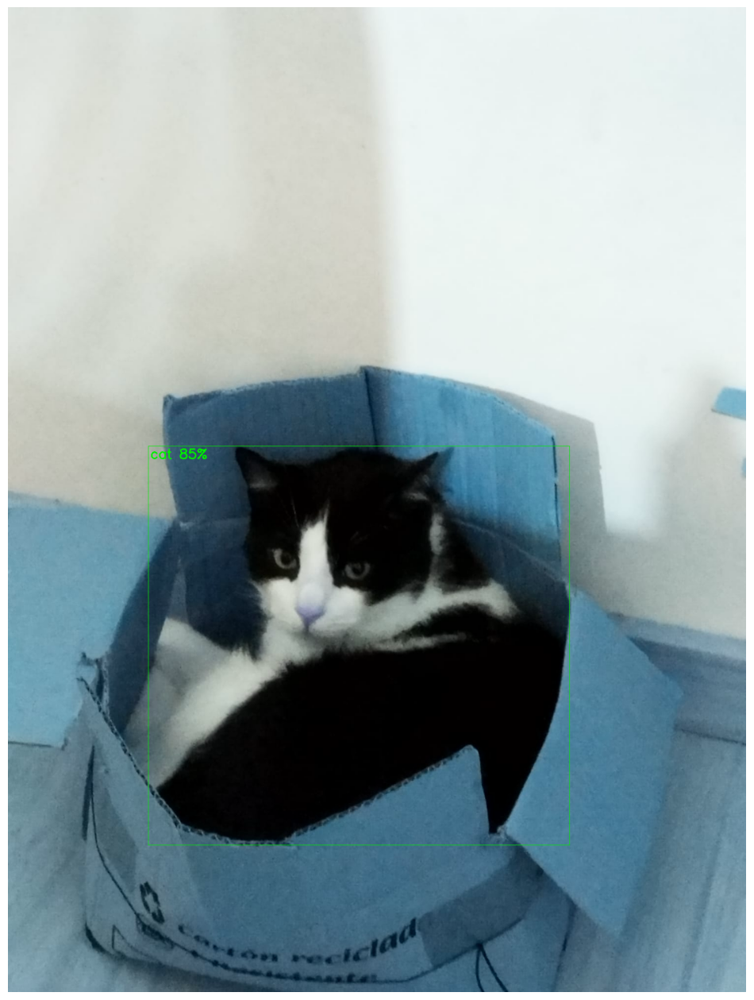

In [9]:
model = YOLO("yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.9
color = (0, 240, 0)
thickness = 2

img = cv2.imread('mika.jpg') 
results = model(img)

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        confidence = math.ceil((box.conf[0]*100))
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imwrite('resultado.jpg', img)

plt.figure(figsize=(12, 20)) 
plt.imshow(img)
plt.axis("off") 
plt.show()

In [10]:

model = YOLO("yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


0: 480x640 2 persons, 1 tv, 2 laptops, 33.0ms
Speed: 0.8ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


error: OpenCV(4.10.0) /io/opencv/modules/highgui/src/window.cpp:1301: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

In [ ]:
!yolo task=detect mode=train epochs=50 batch=10 model='yolo11s' data='/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/data.yaml' project="predicciones"

New https://pypi.org/project/ultralytics/8.3.78 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.75 🚀 Python-3.12.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo11s, data=/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=predicciones, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agno

In [ ]:
!yolo predict model='/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt' source='carTest.jpg' project="predicciones" conf=0.35


Ultralytics 8.3.75 🚀 Python-3.12.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/carTest.jpg: 416x416 1 licence, 4.1ms
Speed: 2.2ms preprocess, 4.1ms inference, 89.1ms postprocess per image at shape (1, 3, 416, 416)
Results saved to predicciones/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
model = ultralytics.YOLO("yolo/yolo11s.pt")

model.train(data=r"/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/data.yaml", 
           imgsz=400,
           batch=10,
           epochs=1,             
           device='0') 


Ultralytics 8.3.74 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo/yolo11s.pt, data=/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/data.yaml, epochs=1, time=None, patience=100, batch=10, imgsz=400, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fal

train: Scanning /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1      1.39G      1.883      4.994      1.498         22        416: 100%|██████████| 21/21 [00:01<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


                   all         60         64      0.444      0.531      0.461      0.208

1 epochs completed in 0.002 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 19.1MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.81it/s]


                   all         60         64      0.421      0.531       0.46      0.208
Speed: 0.2ms preprocess, 0.9ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x74462792c130>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
model = ultralytics.YOLO(r'/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt')  

img = r'carTest.jpg'

results = model(img)  
results[0].show()



image 1/1 /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/carTest.jpg: 416x416 1 licence, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 416)


Se está abriendo en una sesión de navegador existente.


## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [1]:
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
import csv
from datetime import datetime
import os


class ObjectCounter(BaseSolution):
    """
    A class to manage the counting of objects in a real-time video stream based on their tracks.

    This class extends the BaseSolution class and provides functionality for counting objects moving in and out of a
    specified region in a video stream. It supports both polygonal and linear regions for counting.

    Attributes:
        in_count (int): Counter for objects moving inward.
        out_count (int): Counter for objects moving outward.
        counted_ids (List[int]): List of IDs of objects that have been counted.
        saved_ids (List[int]): List of IDs of objects that have been saved to the CSV file.
        classwise_counts (Dict[str, Dict[str, int]]): Dictionary for counts, categorized by object class.
        region_initialized (bool): Flag indicating whether the counting region has been initialized.
        show_in (bool): Flag to control display of inward count.
        show_out (bool): Flag to control display of outward count.
    """

    def __init__(self, **kwargs):
        """Initializes the ObjectCounter class for real-time object counting in video streams."""
        super().__init__(**kwargs)

        self.in_count = 0  # Contador de objetos que se mueven hacia adentro
        self.out_count = 0  # Contador de objetos que se mueven hacia afuera
        self.counted_ids = []  # Lista de IDs de objetos ya contados
        self.saved_ids = []  # Lista de IDs ya guardados en el archivo CSV
        self.classwise_counts = {}  # Diccionario para conteos, categorizados por clase de objeto
        self.region_initialized = False  # Booleano para la inicialización de la región

        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        """Save the label, track_id, action, and current time to a new CSV file with the current date."""
        if track_id in self.saved_ids:
            return  # Ignorar guardar el ID si ya está en la lista

        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        current_date = datetime.now().strftime("%Y-%m-%d")  # Fecha actual en el formato correcto

        # Crear nombre de archivo con la fecha actual
        filename = f'tracked_objects_{current_date}.csv'

        # Verificar si el archivo existe, si es así, escribir otro nombre
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)

            # Si el archivo no existe, escribir encabezados
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])

            # Escribir datos con el ID actual
            writer.writerow([track_id, label, action, current_time.split()[0], current_time.split()[1]])
            self.saved_ids.append(track_id)  # Marcar el ID como guardado

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        """
        Counts objects within a polygonal or linear region based on their tracks.

        Args:
            current_centroid (Tuple[float, float]): Current centroid values in the current frame.
            track_id (int): Unique identifier for the tracked object.
            prev_position (Tuple[float, float]): Last frame position coordinates (x, y) of the track.
            cls (int): Class index for classwise count updates.
        """
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None  # Por defecto es None

        if len(self.region) == 2:  # Región lineal
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    if current_centroid[0] > prev_position[0]:  # Moviéndose a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        elif len(self.region) > 2:  # Región poligonal
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max([p[0] for p in self.region]) - min([p[0] for p in self.region])
                region_height = max([p[1] for p in self.region]) - min([p[1] for p in self.region])

                if region_width < region_height:
                    if current_centroid[0] > prev_position[0]:  # Moviéndose a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        # Guardar la etiqueta y la acción
        if action:
            label = f"{self.names[cls]} ID: {track_id}"
            self.save_label_to_csv(track_id, label, action)

    def store_classwise_counts(self, cls):
        """Initialize class-wise counts for a specific object class if not already present."""
        if self.names[cls] not in self.classwise_counts:
            self.classwise_counts[self.names[cls]] = {"IN": 0, "OUT": 0}

    def display_counts(self, im0):
        """Displays object counts on the input image or frame."""
        labels_dict = {
            str.capitalize(key): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
            f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }

        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

        for track_id in self.track_ids:
            if track_id in self.counted_ids:
                in_count = self.in_count
                label = f"ID:{track_id} count at number {in_count}"
                self.annotator.box_label(self.boxes[self.track_ids.index(track_id)], label=label, color=(255, 255, 0))

    def count(self, im0):
        """Processes input data (frames or object tracks) and updates object counts."""
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True

        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(reg_pts=self.region, color=(104, 0, 123), thickness=self.line_width * 2)

        for box, track_id, cls in zip(self.boxes, self.track_ids, self.clss):
            self.store_tracking_history(track_id, box)
            self.store_classwise_counts(cls)

            label = f"{self.names[cls]} ID: {track_id}"
            self.annotator.box_label(box, label=label, color=colors(cls, True))

            current_centroid = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
            prev_position = self.track_history[track_id][-2] if len(self.track_history[track_id]) > 1 else None
            self.count_objects(current_centroid, track_id, prev_position, cls)

        self.display_counts(im0)
        self.display_output(im0)

        return im0

In [2]:
import cv2

# Función para el tracking del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprueba que se mueva el ratón
        point = [x, y]
        print(f"Mouse moved to: {point}")

# Abrir el video
cap = cv2.VideoCapture('1.mp4')

# Define región para contar
region_points = [(386,103), (458, 499)]

# Inicializa el contador
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo que cuente objetos
    classes=[0],  # Fijar la detección de clases a personas
    show_in=True,  # Enseñar contador de entradas
    show_out=True,  # Enseñar contador de salidas
    line_width=2,  # Adjustar ancho de linea para el output
)

# Crear una ventana con nombre y activar detección de ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video se acaba, comenzar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    count += 1
    if count % 2 != 0:  # Saltar fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Enseñar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Pulsar q para salir
        break

# Liberar el capturador de video y cerrar la ventana
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(386, 103), (458, 499)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [0], 'line_width': 2}


QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is n


0: 320x640 6 persons, 36.7ms
Speed: 2.8ms preprocess, 36.7ms inference, 106.3ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 5.5ms
Speed: 1.3ms preprocess, 5.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 5.0ms
Speed: 1.2ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 5.5ms
Speed: 2.0ms preprocess, 5.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 6

## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [3]:
cap = cv2.VideoCapture('vehicle-counting.mp4')
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"Dimensiones del video: {width}x{height}")
cap.release()

def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(f"Mouse moved to: {point}")

cap = cv2.VideoCapture('vehicle-counting.mp4')
region_points = [(0, 255), (1019, 255)]

counter = ObjectCounter(
    region=region_points,
    model="yolo11s.pt",
    classes=[2, 7],
    show_in=True,
    show_out=True,
    line_width=2,
)

cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    count += 1
    if count % 2 != 0:
        continue

    frame = cv2.resize(frame, (1020, 500))
    frame = counter.count(frame)
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()


Dimensiones del video: 3840x2160
Ultralytics Solutions: ✅ {'region': [(0, 255), (1019, 255)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [2, 7], 'line_width': 2}


QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is n


0: 320x640 4 cars, 1 truck, 3.6ms
Speed: 0.8ms preprocess, 3.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 5.6ms
Speed: 1.4ms preprocess, 5.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 1.0ms 

## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

In [4]:
# Definir la función de callback del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprobar el movimiento del ratón
        point = [x, y]
        print(f"Ratón movido a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('coches.mp4')

# Definir puntos de la región para el conteo
region_points = [(0,500), (1020, 0)]

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model=r'/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt',
    classes=[0],  # Detectar solo la clase matriculas
    show_in=True,  # Mostrar el conteo de entradas
    show_out=True,  # Mostrar el conteo de salidas
    line_width=2,  # Ajustar el grosor de la línea para la visualización
)

# Crear una ventana con nombre y establecer el callback del ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video termina, reiniciar al principio
    #cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    #continue
    count += 1
    if count % 2 != 0:  # Saltar los fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Presionar 'q' para salir
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 500), (1020, 0)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': '/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt', 'classes': [0], 'line_width': 2}

0: 224x416 1 licence, 32.5ms
Speed: 0.6ms preprocess, 32.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 416)


QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is not the object's thread (0x1a57eae0).
Cannot move to target thread (0x1a61d4d0)

QObject::moveToThread: Current thread (0x1a61d4d0) is n


0: 224x416 1 licence, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 1 licence, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 2 licences, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 3 licences, 4.4ms
Speed: 0.6ms preprocess, 4.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 3 licences, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 4 licences, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 4 licences, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 416)

0: 224x416 4 licences, 4.7ms
Speed: 0.6ms preprocess, 4.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224,

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lj7pM5FoHvTJsrCCDypm")
project = rf.workspace("irune").project("car-parts-pgo19-mkgyq")
version = project.version(1)
dataset = version.download("sam2")
import os

                

  Using cached roboflow-1.1.54-py3-none-any.whl.metadata (9.7 kB)
  Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl.metadata (14 kB)
Using cached roboflow-1.1.54-py3-none-any.whl (83 kB)
Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.9 MB)
Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl (54 kB)
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0
error: uninstall-no-record-file

× Cannot uninstall opencv-python-headless 4.10.0
╰─> The package's contents are unknown: no RECORD file was found for opencv-python-headless.

hint: The package was installed by conda. You should check if it can uninstall the package.


ModuleNotFoundError: No module named 'roboflow'

In [ ]:
import torch
print(f"CUDA disponible: {torch.cuda.is_available()}")
print(f"GPU detectada: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'Ninguna'}")

CUDA disponible: True
GPU detectada: NVIDIA GeForce RTX 4080 Laptop GPU


In [ ]:
!git clone https://github.com/facebookresearch/sam2.git
!wget -O /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml 'https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3'

fatal: la ruta de destino 'sam2' ya existe y no es un directorio vacío.
--2025-02-24 18:57:42--  https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3
Resolviendo drive.usercontent.google.com (drive.usercontent.google.com)... 142.250.200.65, 2a00:1450:4003:80c::2001
Conectando con drive.usercontent.google.com (drive.usercontent.google.com)[142.250.200.65]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 11055 (11K) [application/octet-stream]
Guardando como: ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml’

/home/iabd/Escritor 100%[===================>]  10,80K  --.-KB/s    en 0s      

2025-02-24 18:57:45 (154 MB/s) - ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml’ guardado [11055/11055]



In [ ]:
%cd ./sam2/
!pip install -e .[dev]
!pip install supervision -q

/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2


This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.


Obtaining file:///home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Using cached hydra_core-1.3.2-py3-none-any.whl.metadata (5.5 kB)
  Using cached iopath-0.1.10.tar.gz (42 kB)
  Preparing metadata (setup.py) ... done
  Using cached usort-1.0.2-py3-none-any.whl.metadata (3.3 kB)
  Using cached ufmt-2.0.0b2-py3-none-any.whl.metadata (3.9 kB)
  Using cached fvcore-0.1.5.post20221221.tar.gz (50 kB)
  Preparing metadata (setup.py) ... done
  Using cached tensorboard-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached submitit-1.5.2-py3-none-any.whl.metadata (7.9 kB)
  Using cached click-8.1.8-py3-none-any.whl.metadata (2.3 kB)
  Using cached mypy_extensions-1.0.0-py3-none-any.whl.metadata (1.1 kB)
  Using cached pathspec-0.12.1-py3-none-any.whl.metadata (21 kB)
  

In [ ]:
!cd ./checkpoints && ./download_ckpts.sh

--2025-02-24 18:58:50--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolviendo dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.41.12, 18.154.41.57, 18.154.41.96, ...
Conectando con dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)[18.154.41.12]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 156008466 (149M) [application/vnd.snesdev-page-table]
Guardando como: ‘sam2.1_hiera_tiny.pt.1’

sam2.1_hiera_tiny.p 100%[===================>] 148,78M  36,7MB/s    en 4,5s    

2025-02-24 18:58:55 (33,1 MB/s) - ‘sam2.1_hiera_tiny.pt.1’ guardado [156008466/156008466]

--2025-02-24 18:58:55--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolviendo dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.41.8, 18.154.41.96, 18.154.41.12, ...
Conectando con dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)[18.154.41.8]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Lon

In [ ]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
import supervision as sv
import os
import random
from PIL import Image
import numpy as np


In [ ]:
%cd Car-Parts-1/

/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car-Parts-1


In [ ]:
import os
import re

FOLDER = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/train"

for filename in os.listdir(FOLDER):
	# Replace all except last dot with underscore
	new_filename = filename.replace(".", "_", filename.count(".") - 1)
	if not re.search(r"_\d+\.\w+$", new_filename):
		# Add an int to the end of base name
		new_filename = new_filename.replace(".", "_1.")
	os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))
FOLDER = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/test"

for filename in os.listdir(FOLDER):
	# Replace all except last dot with underscore
	new_filename = filename.replace(".", "_", filename.count(".") - 1)
	if not re.search(r"_\d+\.\w+$", new_filename):
		# Add an int to the end of base name
		new_filename = new_filename.replace(".", "_1.")
	os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))
FOLDER = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/valid"

for filename in os.listdir(FOLDER):
	# Replace all except last dot with underscore
	new_filename = filename.replace(".", "_", filename.count(".") - 1)
	if not re.search(r"_\d+\.\w+$", new_filename):
		# Add an int to the end of base name
		new_filename = new_filename.replace(".", "_1.")
	os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))

In [ ]:
%cd ..
%cd sam2

/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2


In [ ]:
!python training/train.py -c 'configs/train.yaml' --use-cluster 0 --num-gpus 1

###################### Train App Config ####################
scratch:
  resolution: 1024
  train_batch_size: 1
  num_train_workers: 10
  num_frames: 1
  max_num_objects: 3
  base_lr: 5.0e-06
  vision_lr: 3.0e-06
  phases_per_epoch: 1
  num_epochs: 40
dataset:
  img_folder: /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/train
  gt_folder: /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/train
  multiplier: 2
vos:
  train_transforms:
  - _target_: training.dataset.transforms.ComposeAPI
    transforms:
    - _target_: training.dataset.transforms.RandomHorizontalFlip
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomAffine
      degrees: 25
      shear: 20
      image_interpolation: bilinear
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomResizeAPI
      sizes: ${scratch.resolution}
      square: true
      consistent_transform: true
    - _target_: training.d

In [ ]:
!ls 

assets		    demo		 notebooks	   sam2_logs
backend.Dockerfile  docker-compose.yaml  pyproject.toml    sav_dataset
Car-Parts-1	    INSTALL.md		 README.md	   setup.py
checkpoints	    LICENSE		 RELEASE_NOTES.md  tools
CODE_OF_CONDUCT.md  LICENSE_cctorch	 sam2		   training
CONTRIBUTING.md     MANIFEST.in		 SAM_2.egg-info    train.yaml


In [ ]:
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CUDA no disponible")

2.6.0+cu124
12.4
True
NVIDIA GeForce RTX 4080 Laptop GPU


In [ ]:
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.build_sam import build_sam2

torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
	torch.backends.cuda.matmul.allow_tf32 = True
	torch.backends.cudnn.allow_tf32 = True

checkpoint = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

checkpoint_base = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg_base = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2_base = build_sam2(model_cfg_base, checkpoint_base, device="cuda")
mask_generator_base = SAM2AutomaticMaskGenerator(sam2_base)

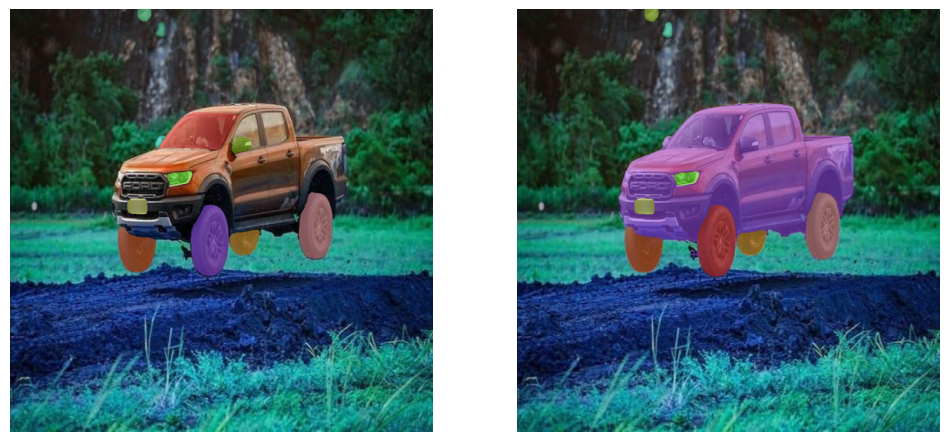

In [ ]:
validation_set = os.listdir("/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/valid")

image = random.choice([img for img in validation_set if img.endswith(".jpg")])
image = os.path.join("/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/valid", image)
opened_image = np.array(Image.open(image).convert("RGB"))
result = mask_generator.generate(opened_image)

detections = sv.Detections.from_sam(sam_result=result)

mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
annotated_image = opened_image.copy()
annotated_image = mask_annotator.annotate(annotated_image, detections=detections)

base_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)

base_result = mask_generator_base.generate(opened_image)
base_detections = sv.Detections.from_sam(sam_result=base_result)
base_annotated_image = opened_image.copy()
base_annotated_image = base_annotator.annotate(base_annotated_image, detections=base_detections)

sv.plot_images_grid(images=[annotated_image, base_annotated_image], grid_size=(1, 2))

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS